In [16]:
# !pip install torch
# pip install torch torchvision torchaudio -f https://download.pytorch.org/whl/cu{12.6}/torch_stable.html
#!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126
# import torch
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(device)
# tensor = torch.randn((3, 3))
# tensor = tensor.to('cuda')
#!nvcc --version

## .nc Dateien ##

In [17]:
import xarray
import os
import pandas as pd
from Preprocessing import *

extractor = FileExtractor()

df_dwd_hornsea_unprocessed = extractor.combine_files("nc_files", "dwd_icon_eu_hornsea")
df_dwd_pes_unprocessed = extractor.combine_files("nc_files", "dwd_icon_eu_pes10")
df_dwd_demand_unprocessed = extractor.combine_files("nc_files", "dwd_icon_eu_demand")

ncep_gfs_hornsea_unprocessed = extractor.combine_files("nc_files", "ncep_gfs_hornsea")
ncep_gfs_pes_unprocessed = extractor.combine_files("nc_files", "ncep_gfs_pes10")
ncep_gfs_demand_unprocessed = extractor.combine_files("nc_files", "ncep_gfs_demand")

In [18]:
prep = Preprocessing()

In [19]:
ncep_gfs_pes_unprocessed.SolarDownwardRadiation.describe()

count    2.212924e+07
mean     1.249461e+02
std      2.055290e+02
min      0.000000e+00
25%      0.000000e+00
50%      3.700001e+00
75%      1.767200e+02
max      2.264340e+03
Name: SolarDownwardRadiation, dtype: float64

Visualisierung auf der Karte

<Axes: >

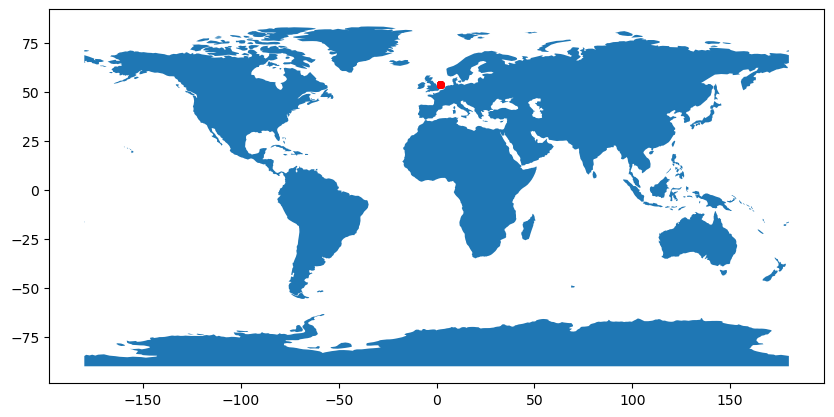

In [20]:
import matplotlib.pyplot as plt
import pandas as pd
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame
import geodatasets

df1_ = pd.concat([df_dwd_hornsea_unprocessed.reset_index()[["latitude", "longitude"]].drop_duplicates(), ncep_gfs_hornsea_unprocessed.reset_index()[["latitude", "longitude"]].drop_duplicates()])

geometry = [Point(xy) for xy in zip(df1_['longitude'], df1_['latitude'])]
gdf = GeoDataFrame(df1_, geometry=geometry)   

#this is a simple map that goes with geopandas
# deprecated: world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world = gpd.read_file(geodatasets.data.naturalearth.land['url'])
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15)

<Axes: >

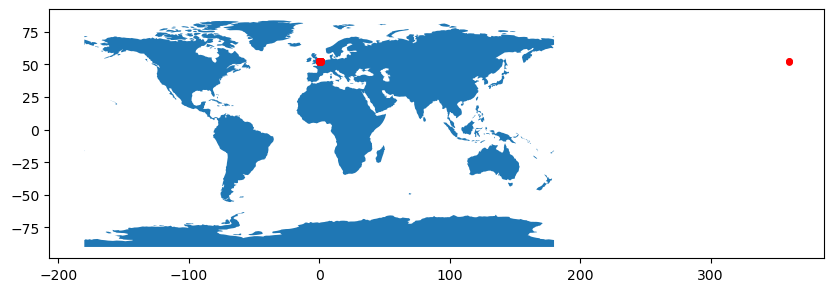

In [21]:
df2_ = pd.concat([df_dwd_pes_unprocessed.reset_index()[["latitude", "longitude"]].drop_duplicates(), ncep_gfs_pes_unprocessed.reset_index()[["latitude", "longitude"]].drop_duplicates()])

geometry = [Point(xy) for xy in zip(df2_['longitude'], df2_['latitude'])]
gdf = GeoDataFrame(df2_, geometry=geometry)   

#this is a simple map that goes with geopandas
# deprecated: world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world = gpd.read_file(geodatasets.data.naturalearth.land['url'])
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15)

<Axes: >

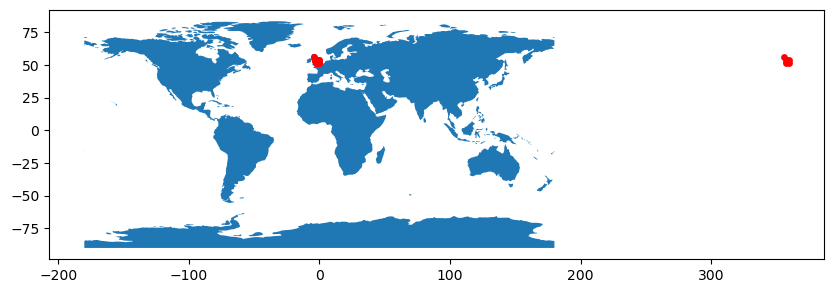

In [22]:
df3_ = pd.concat([df_dwd_demand_unprocessed.reset_index()[["latitude", "longitude"]].drop_duplicates(), ncep_gfs_demand_unprocessed.reset_index()[["latitude", "longitude"]].drop_duplicates()])

geometry = [Point(xy) for xy in zip(df3_['longitude'], df3_['latitude'])]
gdf = GeoDataFrame(df3_, geometry=geometry)   

#this is a simple map that goes with geopandas
# deprecated: world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world = gpd.read_file(geodatasets.data.naturalearth.land['url'])
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15)

Gemeinsame Koordinaten für Hornsea

In [23]:
# print("DWD")
# print(len(df_dwd_hornsea_unprocessed.reset_index().latitude.unique()), "verschiedene Breitengradkoordinaten.")
# print(len(df_dwd_hornsea_unprocessed.reset_index().longitude.unique()), "verschiedene Längengradkoordinaten.")
# print("NCEP GFS")
# print(len(ncep_gfs_hornsea_unprocessed.reset_index().latitude.unique()), "verschiedene Breitengradkoordinaten.")
# print(len(ncep_gfs_hornsea_unprocessed.reset_index().longitude.unique()), "verschiedene Längengradkoordinaten.")
# print("Schnittmenge")
# print(len(set([*ncep_gfs_hornsea_unprocessed.reset_index().latitude.unique(), *df_dwd_hornsea_unprocessed.reset_index().latitude.unique()])), "verschiedene Breitengradkoordinaten")
# print(len(set([*ncep_gfs_hornsea_unprocessed.reset_index().longitude.unique(), *df_dwd_hornsea_unprocessed.reset_index().longitude.unique()])), "verschiedene Längengradkoordinaten")

Gemeinsame Koordinaten für Demand

In [24]:
# print("DWD")
# print(len(df_dwd_demand_unprocessed.reset_index().latitude.unique()), "verschiedene Breitengradkoordinaten.")
# print(len(df_dwd_demand_unprocessed.reset_index().longitude.unique()), "verschiedene Längengradkoordinaten.")
# print("NCEP GFS")
# print(len(ncep_gfs_demand_unprocessed.reset_index().latitude.unique()), "verschiedene Breitengradkoordinaten.")
# print(len(ncep_gfs_demand_unprocessed.reset_index().longitude.unique()), "verschiedene Längengradkoordinaten.")
# print("Schnittmenge")
# print(len(set([*ncep_gfs_demand_unprocessed.reset_index().latitude.unique(), *df_dwd_demand_unprocessed.reset_index().latitude.unique()])), "verschiedene Breitengradkoordinaten")
# print(len(set([*ncep_gfs_demand_unprocessed.reset_index().longitude.unique(), *df_dwd_demand_unprocessed.reset_index().longitude.unique()])), "verschiedene Längengradkoordinaten")

Gemeinsame Koordinaten für PES

In [25]:
# print("DWD")
# print(len(df_dwd_pes_unprocessed.reset_index().latitude.unique()), "verschiedene Breitengradkoordinaten.")
# print(len(df_dwd_pes_unprocessed.reset_index().longitude.unique()), "verschiedene Längengradkoordinaten.")
# print("NCEP GFS")
# print(len(ncep_gfs_pes_unprocessed.reset_index().latitude.unique()), "verschiedene Breitengradkoordinaten.")
# print(len(ncep_gfs_pes_unprocessed.reset_index().longitude.unique()), "verschiedene Längengradkoordinaten.")
# print("Schnittmenge")
# print(len(set([*ncep_gfs_pes_unprocessed.reset_index().latitude.unique(), *df_dwd_pes_unprocessed.reset_index().latitude.unique()])), "verschiedene Breitengradkoordinaten")
# print(len(set([*ncep_gfs_pes_unprocessed.reset_index().longitude.unique(), *df_dwd_pes_unprocessed.reset_index().longitude.unique()])), "verschiedene Längengradkoordinaten")

In [26]:
import numpy as np
import dask.dataframe as dd
import math

preprocesser = Preprocessing()

# df_dwd_hornsea = preprocesser.preprocess_geo_data(df_dwd_hornsea_unprocessed)
# ncep_gfs_hornsea = preprocesser.preprocess_geo_data(ncep_gfs_hornsea_unprocessed)
# df_dwd_pes = preprocesser.preprocess_geo_data(df_dwd_pes_unprocessed)
# ncep_gfs_pes = preprocesser.preprocess_geo_data(ncep_gfs_pes_unprocessed)
# df_dwd_demand = preprocesser.preprocess_geo_data(df_dwd_demand_unprocessed)
# ncep_gfs_demand = preprocesser.preprocess_geo_data(ncep_gfs_demand_unprocessed)

In [27]:
df_hornsea = preprocesser.preprocess_geo_data(df_dwd_hornsea_unprocessed, ncep_gfs_hornsea_unprocessed)
df_pes = preprocesser.preprocess_geo_data(df_dwd_pes_unprocessed, ncep_gfs_pes_unprocessed)
df_demand = preprocesser.preprocess_geo_data(df_dwd_demand_unprocessed, ncep_gfs_demand_unprocessed)

In [ ]:
import plotly.express as px
import matplotlib.pyplot as plt

fig = px.histogram(df_dwd_hornsea_unprocessed.reset_index(), x="RelativeHumidity")
fig.show()

In [ ]:
df = df_dwd_hornsea_unprocessed.copy()
df = df.reset_index()
# rename the columns properly
if "index" in df.columns:
    df = df.drop(columns=["index"], axis=1)

new_cols = {"level_0": "ref_time",
            "level_1": "val_time",
            "latitude": "lat",
            "longitude": "long",
            "RelativeHumidity": "rel_hum",
            "Temperature": "temp",
            "TotalPrecipitation": "total_prec",
            "WindDirection" : "wind_dir",
            "WindDirection:100": "wind_dir_100",
            "WindSpeed": "wind_speed",
            "WindSpeed:100" : "wind_speed_100",
            "CloudCover": "cloud_cover",
            "SolarDownwardRadiation": "solar_down_rad"}
for col in new_cols.keys():
    if col in df.columns:
        df = df.rename(columns = {col: new_cols[col]})

# convert the datetime information to the right format
df["ref_time"] = pd.to_datetime(df.ref_time).dt.tz_localize("UTC")
df["forecast_horizon"] = df["val_time"]
df["val_time"] = df["ref_time"] + pd.to_timedelta(df["val_time"], unit = "hour")

# remove forecasts which extend beyond the day ahead, since they will be outdated the next day anyway
df = df[(df["val_time"] - df["ref_time"]).div(pd.Timedelta("1h")) < 50]

# drop duplicate rows
df = df.drop_duplicates()

# adjust invalid longitude values
df.loc[df.long > 90, "long"] -= 360
df.loc[df.long < -90, "long"] += 360

In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose

# Assuming your time series data is stored in a pandas DataFrame called 'data' with a column named 'value'
# Assuming the time series has a frequency of 1 day

df = df.dropna()
# Decompose the time series with a 365-day seasonality
decomposition = seasonal_decompose(df['rel_hum'], model='additive', period=2622960)

# Get the residuals and drop NaN values
residuals = decomposition.resid

# Calculate the z-scores for the residuals
z_scores = (residuals - np.mean(residuals)) / np.std(residuals)

# Identify outliers based on z-scores > 3 or < -3

# Print the outliers

In [ ]:
fig = px.histogram(df.loc[np.abs(z_scores) <= 3], x="rel_hum")
fig.show()

In [16]:
for column in df_dwd_hornsea.columns:

    q1 = df_dwd_hornsea[column].quantile(0.25)
    q3 = df_dwd_hornsea[column].quantile(0.75)
    iqr = q3 - q1

    lower_bound = q1 - 1.5*iqr
    upper_bound = q3 + 1.5*iqr

    num_outliers = len(df_dwd_hornsea.loc[(df_dwd_hornsea[column] >= upper_bound) | (df_dwd_hornsea[column] <= lower_bound)])
    print(num_outliers)

0
0
0
0
25889
0
0
0
15545
14379
0
0
0
0
0


In [ ]:
num_outliers = 0
for column in df_dwd_hornsea_unprocessed.columns:
    q1 = df_dwd_hornsea_unprocessed[column].quantile(0.25)
    q3 = df_dwd_hornsea_unprocessed[column].quantile(0.75)
    iqr = q3 - q1

    lower_bound = q1 - 1.5*iqr
    upper_bound = q3 + 1.5*iqr

    num_outliers += len(df_dwd_hornsea_unprocessed.loc[(df_dwd_hornsea_unprocessed[column] >= upper_bound) | (df_dwd_hornsea_unprocessed[column] <= lower_bound)])
num_outliers

In [20]:
hornsea = preprocesser.merge_weather_stations_data(df_dwd_hornsea, ncep_gfs_hornsea)
demand = preprocesser.merge_weather_stations_data(df_dwd_demand, ncep_gfs_demand)
pes = preprocesser.merge_weather_stations_data(df_dwd_pes, ncep_gfs_pes)

## .JSON Dateien ##

In den JSON-Dateien befinden sich Informationen zu (un-)geplanten Ausfällen auf der Windkraftanlage HORNSEA.

In [23]:
import json

json_data = extractor.extract_json_files("nc_files/REMIT")

In [24]:
json_data.head()

,id,dataset,mrid,revisionNumber,publishTime,createdTime,messageType,messageHeading,eventType,unavailabilityType,...,fuelType,normalCapacity,availableCapacity,unavailableCapacity,eventStatus,eventStartTime,eventEndTime,cause,outageProfile,relatedInformation
0,17116,REMIT,11XDONG-PT-----2-NGET-RMT-00001689,1,2023-07-17T10:42:04Z,2023-07-17T10:35:00Z,UnavailabilitiesOfElectricityFacilities,REMIT Information,Production unavailability,Planned,...,Wind Offshore,400,0,400,Active,2023-07-18T08:00:00Z,2023-07-18T14:00:00Z,Planned Outage,"[{'startTime': '2023-07-18T08:00:00Z', 'endTim...",NaN
1,17326,REMIT,11XDONG-PT-----2-NGET-RMT-00001689,2,2023-07-18T14:12:03Z,2023-07-18T14:07:00Z,UnavailabilitiesOfElectricityFacilities,REMIT Information,Production unavailability,Planned,...,Wind Offshore,400,0,400,Active,2023-07-18T08:00:00Z,2023-07-18T16:00:00Z,Planned Outage,"[{'startTime': '2023-07-18T08:00:00Z', 'endTim...",NaN
2,17618,REMIT,11XDONG-PT-----2-NGET-RMT-00001695,1,2023-07-20T03:06:40Z,2023-07-19T07:50:00Z,UnavailabilitiesOfElectricityFacilities,REMIT Information,Production unavailability,Planned,...,Wind Offshore,400,0,400,Active,2023-07-24T06:00:00Z,2023-07-24T14:00:00Z,Planned Outage,"[{'startTime': '2023-07-24T06:00:00Z', 'endTim...",NaN
3,18969,REMIT,11XDONG-PT-----2-NGET-RMT-00001695,2,2023-07-24T07:00:04Z,2023-07-24T06:55:00Z,UnavailabilitiesOfElectricityFacilities,REMIT Information,Production unavailability,Planned,...,Wind Offshore,400,0,400,Active,2023-07-24T06:00:00Z,2023-07-24T08:00:00Z,Planned Outage,"[{'startTime': '2023-07-24T06:00:00Z', 'endTim...",NaN
4,19014,REMIT,11XDONG-PT-----2-NGET-RMT-00001701,1,2023-07-24T11:00:04Z,2023-07-24T10:55:00Z,UnavailabilitiesOfElectricityFacilities,REMIT Information,Production unavailability,Planned,...,Wind Offshore,400,0,400,Active,2023-07-25T06:00:00Z,2023-07-25T14:00:00Z,Planned Outage,"[{'startTime': '2023-07-25T06:00:00Z', 'endTim...",NaN


In [25]:
# df_outage = pd.DataFrame()

# for id, x in json_data[["id", "outageProfile"]].iterrows():
#     now_id = x["id"]
#     for y in x["outageProfile"]:
#         y["id"] = now_id
#         df_outage = pd.concat([df_outage, pd.json_normalize(y)])

# df_outage

Die JSON-Datei enthält Informationen zu geplanten oder unerwarteten Ausfällen in der Windkraftanlage HORNSEA. Jede Zeile beschreibt einen Vorfall und dessen Beginn und Abschluss. 

Daher wird jede Zeile genutzt, um aus der Dauer zwischen Anfang und Beginn eines Ausfalls ein Zeitintervallindex zu erstellen mit einem Intervall von 30 Minuten. Anschließend wird dieser neue Datensatz mit den HORNSEA-Daten zusammengefügt.

In [26]:
outages_df = preprocesser.preprocess_outage_data(json_data)

c:\Users\Leonard\vscode\awp2\Preprocessing.py:150: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  json_data.drop(columns = ["id", "outageProfile", "assetId", "affectedUnitEIC", "dataset", "eventStatus", "cause", "publishTime", "createdTime", "relatedInformation", "revisionNumber", "mrid"], axis = 1, inplace = True)
c:\Users\Leonard\vscode\awp2\Preprocessing.py:159: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  json_data.drop(columns = col, inplace = True, axis = 1)
c:\Users\Leonard\vscode\awp2\Preprocessing.py:159: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveat

In [27]:
import plotly.express as px

px.scatter(outages_df[["affectedUnit", "unavailabilityType"]], color = "unavailabilityType", title = "Ausfallszeiträume der HORNSEA-Windkraftanlagen")

## .csv Dateien ##

In [28]:
import pandas as pd
import os
from Preprocessing import *
preprocesser = Preprocessing()

In [30]:
df_energy = extractor.combine_files("csv_files", "Energy_data", ".csv")

In [31]:
df_energy.head()

,dtm,MIP,Solar_MW,Solar_capacity_mwp,Solar_installedcapacity_mwp,Wind_MW,SS_Price,boa_MWh,DA_Price
0,2020-09-20T00:00:00Z,20.06,0.0,2108.489754,2206.064655,996.284,2.50,0.0,32.17
1,2020-09-20T00:30:00Z,19.77,0.0,2108.489754,2206.064655,957.576,15.00,0.0,32.17
2,2020-09-20T01:00:00Z,28.68,0.0,2108.489754,2206.064655,941.044,47.95,0.0,32.00
3,2020-09-20T01:30:00Z,28.97,0.0,2108.489754,2206.064655,964.366,29.13,0.0,32.00
4,2020-09-20T02:00:00Z,28.19,0.0,2108.489754,2206.064655,918.432,28.95,0.0,31.99


In [32]:
df_energy = preprocesser.preprocess_energy_data(df_energy)

Kombination von csv- und JSON-Dateien

In [33]:
pd.set_option('future.no_silent_downcasting', True)

energy_with_outages = preprocesser.merge_energy_with_outages(df_energy, outages_df)

In [34]:
df_energy.sort_index()

,dtm,MIP,Solar_MWh_credit,Solar_capacity_mwp,Solar_installedcapacity_mwp,SS_Price,boa_MWh,DA_Price,Wind_MWh_credit
0,2020-09-20 00:00:00+00:00,20.06,0.0,2108.489754,2206.064655,2.50000,0.0,32.17,498.142
0,2020-09-20 00:00:00+00:00,20.06,0.0,2130.537493,2228.208777,2.50000,0.0,32.17,498.142
0,2024-01-19 00:00:00+00:00,51.13,0.0,2448.350087,2609.200511,53.00000,0.0,62.03,456.520
1,2020-09-20 00:30:00+00:00,19.77,0.0,2130.537493,2228.208777,15.00000,0.0,32.17,478.788
1,2020-09-20 00:30:00+00:00,19.77,0.0,2108.489754,2206.064655,15.00000,0.0,32.17,478.788
...,...,...,...,...,...,...,...,...,...
58363,2024-01-18 21:30:00+00:00,71.24,0.0,2448.407255,2609.200511,57.49165,0.0,64.75,577.280
58364,2024-01-18 22:00:00+00:00,70.15,0.0,2448.407255,2609.200511,46.14432,0.0,65.88,570.510
58365,2024-01-18 22:30:00+00:00,68.36,0.0,2448.407255,2609.200511,50.00000,0.0,65.88,583.830
58366,2024-01-18 23:00:00+00:00,68.77,0.0,2448.407255,2609.200511,35.00000,0.0,64.74,560.580


In [35]:
energy_with_outages.head()

,dtm,MIP,Solar_MWh_credit,Solar_capacity_mwp,Solar_installedcapacity_mwp,SS_Price,boa_MWh,DA_Price,Wind_MWh_credit,unavailabilityType,affectedUnit,availableCapacity,unavailableCapacity,hoursSinceOutage,hoursUntilOutageEnd,outage
0,2020-09-20 00:00:00+00:00,20.06,0.0,2108.489754,2206.064655,2.50,0.0,32.17,498.142,None,None,400.0,0.0,0.0,0.0,0
1,2020-09-20 00:00:00+00:00,20.06,0.0,2130.537493,2228.208777,2.50,0.0,32.17,498.142,None,None,400.0,0.0,0.0,0.0,0
2,2020-09-20 00:30:00+00:00,19.77,0.0,2130.537493,2228.208777,15.00,0.0,32.17,478.788,None,None,400.0,0.0,0.0,0.0,0
3,2020-09-20 00:30:00+00:00,19.77,0.0,2108.489754,2206.064655,15.00,0.0,32.17,478.788,None,None,400.0,0.0,0.0,0.0,0
4,2020-09-20 01:00:00+00:00,28.68,0.0,2108.489754,2206.064655,47.95,0.0,32.00,470.522,None,None,400.0,0.0,0.0,0.0,0


Kombination mit CDF-Dateien

In [36]:
# merged_hornsea = preprocesser.merge_geo_energy_outage_data(hornsea, energy_with_outages)
# merged_pes = preprocesser.merge_geo_energy_outage_data(pes, energy_with_outages)
# merged_demand = preprocesser.merge_geo_energy_outage_data(demand, energy_with_outages)

merged_hornsea = preprocesser.merge_geo_energy_outage_data(hornsea, df_energy)
merged_pes = preprocesser.merge_geo_energy_outage_data(pes, df_energy)
merged_demand = preprocesser.merge_geo_energy_outage_data(demand, df_energy)

In [37]:
merged_pes.head()

,CloudCover,SolarDownwardRadiation,Temperature,forecast_horizon,CloudCover_std,SolarDownwardRadiation_std,Temperature_std,CloudCover_mean,SolarDownwardRadiation_mean,Temperature_mean,...,sin_hour,cos_hour,MIP,Solar_MWh_credit,Solar_capacity_mwp,Solar_installedcapacity_mwp,SS_Price,boa_MWh,DA_Price,Wind_MWh_credit
dtm,,,,,,,,,,,,,,,,,,,,,
2020-09-20 00:00:00+00:00,0.238203,0.0,13.793095,0.0,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,0.000000,1.000000,20.06,0.0,2119.513623,2217.136716,2.50,0.0,32.17,498.142
2020-09-20 00:30:00+00:00,0.255606,0.0,13.777544,0.5,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,0.052264,0.982963,19.77,0.0,2119.513623,2217.136716,15.00,0.0,32.17,478.788
2020-09-20 01:00:00+00:00,0.273009,0.0,13.761992,1.0,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,0.104528,0.965926,28.68,0.0,2119.513623,2217.136716,47.95,0.0,32.00,470.522
2020-09-20 01:30:00+00:00,0.279357,0.0,13.789608,1.5,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,0.156220,0.915976,28.97,0.0,2119.513623,2217.136716,29.13,0.0,32.00,482.183
2020-09-20 02:00:00+00:00,0.285705,0.0,13.817223,2.0,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,0.207912,0.866025,28.19,0.0,2119.513623,2217.136716,28.95,0.0,31.99,459.216


In [38]:
merged_hornsea = preprocesser.add_difference_features(merged_hornsea)
merged_pes = preprocesser.add_difference_features(merged_pes)
merged_demand = preprocesser.add_difference_features(merged_demand)

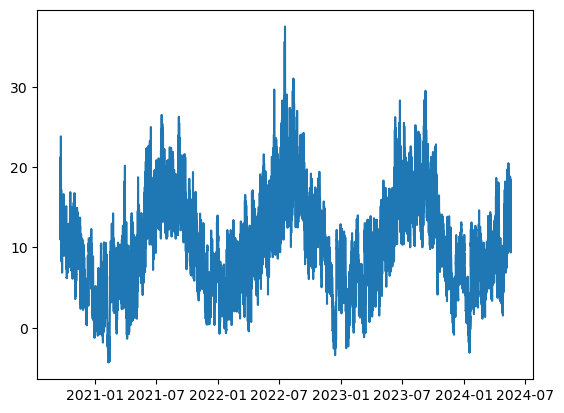

In [39]:
import matplotlib.pyplot as plt

plt.plot(merged_pes.index, merged_pes["Temperature"])

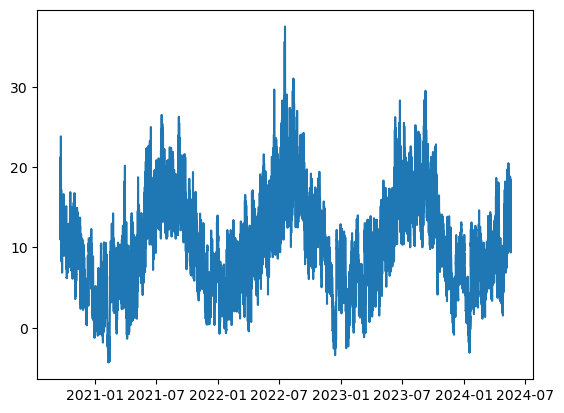

In [40]:
import matplotlib.pyplot as plt

plt.plot(merged_hornsea.index, merged_pes["Temperature"])

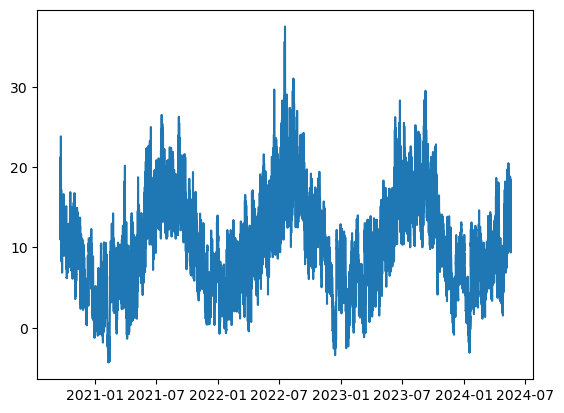

In [41]:
import matplotlib.pyplot as plt

plt.plot(merged_demand.index, merged_pes["Temperature"])

## Feature Engineering ##

In [42]:
merged_hornsea.columns

Index(['RelativeHumidity', 'Temperature', 'WindSpeed', 'WindSpeed:100',
       'forecast_horizon', 'RelativeHumidity_std', 'Temperature_std',
       'WindDirection_std', 'WindDirection:100_std', 'WindSpeed_std',
       'WindSpeed:100_std', 'RelativeHumidity_mean', 'Temperature_mean',
       'WindDirection_mean', 'WindDirection:100_mean', 'WindSpeed_mean',
       'WindSpeed:100_mean', 'RelativeHumidity_min', 'Temperature_min',
       'WindDirection_min', 'WindDirection:100_min', 'WindSpeed_min',
       'WindSpeed:100_min', 'RelativeHumidity_max', 'Temperature_max',
       'WindDirection_max', 'WindDirection:100_max', 'WindSpeed_max',
       'WindSpeed:100_max', 'WindSpeed_range', 'WindSpeed:100_range',
       'WindSpeedAltitudeDiff', 'WindDirection_sin', 'WindDirection_cos',
       'WindDirection:100_sin', 'WindDirection:100_cos', 'Temperature_range',
       'sin_month', 'cos_month', 'sin_day', 'cos_day', 'sin_dayofweek',
       'cos_dayofweek', 'sin_hour', 'cos_hour', 'MIP', 'Solar_MWh

In [43]:
merged_pes.columns

Index(['CloudCover', 'SolarDownwardRadiation', 'Temperature',
       'forecast_horizon', 'CloudCover_std', 'SolarDownwardRadiation_std',
       'Temperature_std', 'CloudCover_mean', 'SolarDownwardRadiation_mean',
       'Temperature_mean', 'CloudCover_min', 'SolarDownwardRadiation_min',
       'Temperature_min', 'CloudCover_max', 'SolarDownwardRadiation_max',
       'Temperature_max', 'SolarDownwardRadiation_range',
       'Interaction_SolarDownwardRadiation_Temperature', 'Temperature_range',
       'sin_month', 'cos_month', 'sin_day', 'cos_day', 'sin_dayofweek',
       'cos_dayofweek', 'sin_hour', 'cos_hour', 'MIP', 'Solar_MWh_credit',
       'Solar_capacity_mwp', 'Solar_installedcapacity_mwp', 'SS_Price',
       'boa_MWh', 'DA_Price', 'Wind_MWh_credit', 'Temperature_diff',
       'MIP_diff', 'CloudCover_diff', 'SolarDownwardRadiation_diff'],
      dtype='object')

In [44]:
from sklearn.preprocessing import OneHotEncoder

# columns_to_ohe = ["unavailabilityType", "affectedUnit"]

# ohe_hornsea = OneHotEncoder(sparse_output = False)
# ohe_hornsea.fit_transform(merged_hornsea[columns_to_ohe])
# ohe_hornsea.get_feature_names_out()

In [45]:
merged_pes

,CloudCover,SolarDownwardRadiation,Temperature,forecast_horizon,CloudCover_std,SolarDownwardRadiation_std,Temperature_std,CloudCover_mean,SolarDownwardRadiation_mean,Temperature_mean,...,Solar_capacity_mwp,Solar_installedcapacity_mwp,SS_Price,boa_MWh,DA_Price,Wind_MWh_credit,Temperature_diff,MIP_diff,CloudCover_diff,SolarDownwardRadiation_diff
dtm,,,,,,,,,,,,,,,,,,,,,
2020-09-20 00:00:00+00:00,0.238203,0.000000,13.793095,0.0,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,2119.513623,2217.136716,2.50000,0.0,32.17,498.142,0.000000,0.00,0.000000,0.000000
2020-09-20 00:30:00+00:00,0.255606,0.000000,13.777544,0.5,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,2119.513623,2217.136716,15.00000,0.0,32.17,478.788,-0.015551,-0.29,0.017403,0.000000
2020-09-20 01:00:00+00:00,0.273009,0.000000,13.761992,1.0,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,2119.513623,2217.136716,47.95000,0.0,32.00,470.522,-0.015552,8.91,0.017403,0.000000
2020-09-20 01:30:00+00:00,0.279357,0.000000,13.789608,1.5,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,2119.513623,2217.136716,29.13000,0.0,32.00,482.183,0.027616,0.29,0.006348,0.000000
2020-09-20 02:00:00+00:00,0.285705,0.000000,13.817223,2.0,0.087174,207.424969,2.595224,0.215528,161.913204,15.856665,...,2119.513623,2217.136716,28.95000,0.0,31.99,459.216,0.027615,-0.78,0.006348,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-19 21:30:00+00:00,0.013713,0.027326,10.406772,33.5,0.161393,295.319284,3.524504,0.216126,282.616698,13.355621,...,2573.542092,2741.831037,56.20000,0.0,76.81,113.759,-0.253913,-10.14,0.003102,0.004363
2024-05-19 22:00:00+00:00,0.026658,0.025581,10.012410,34.0,0.161393,295.319284,3.524504,0.216126,282.616698,13.355621,...,2573.542092,2741.831037,102.00023,0.0,71.11,98.545,-0.394361,3.42,0.012944,-0.001745
2024-05-19 22:30:00+00:00,0.025596,0.021994,9.806562,34.5,0.161393,295.319284,3.524504,0.216126,282.616698,13.355621,...,2573.542092,2741.831037,99.00000,0.0,71.11,85.653,-0.205848,-5.13,-0.001061,-0.003587


In [ ]:
feature_engineerer = FeatureEngineerer(merged_pes)

<Axes: >

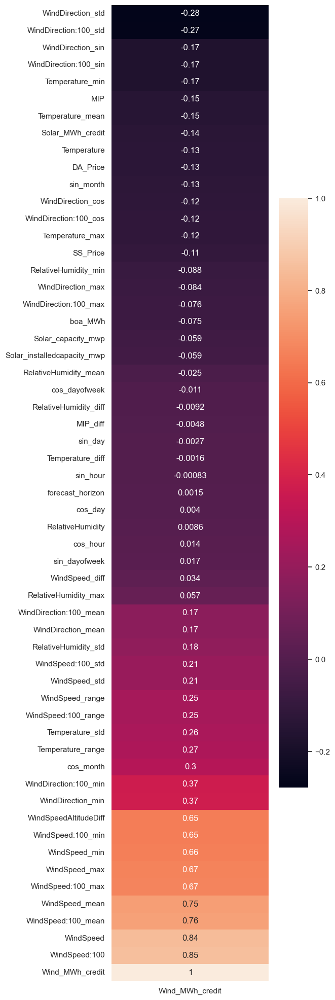

In [48]:
import seaborn as sns
sns.set_theme(rc={'figure.figsize':(5,25)})
sns.heatmap(merged_hornsea.corr()[["Wind_MWh_credit"]].sort_values(by = "Wind_MWh_credit"), annot = True)

<Axes: >

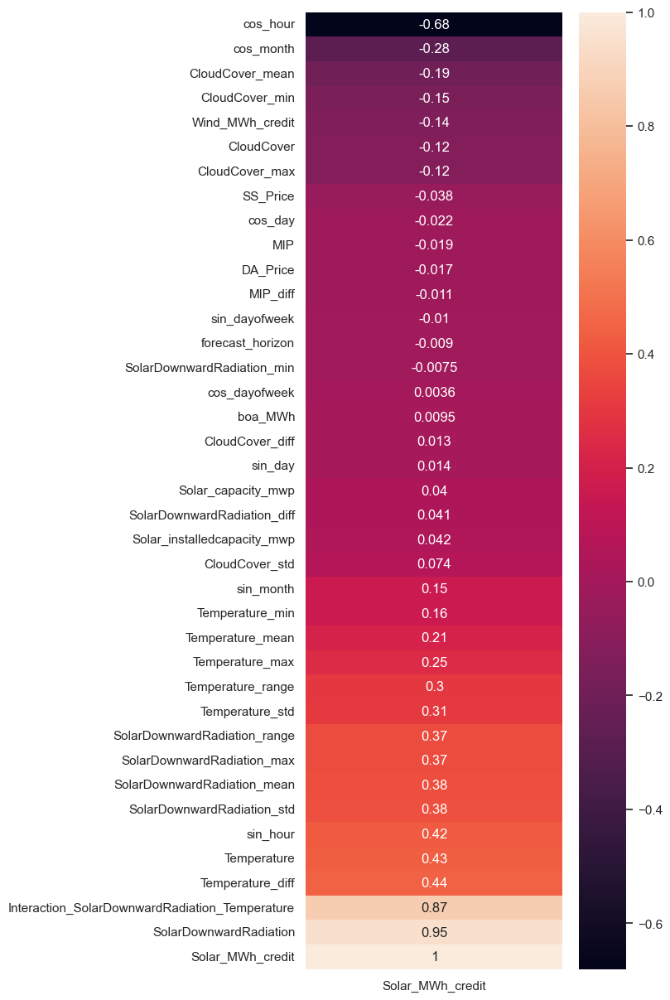

In [49]:
import seaborn as sns
sns.set_theme(rc={'figure.figsize':(5,15)})
sns.heatmap(merged_pes.corr()[["Solar_MWh_credit"]].sort_values(by = "Solar_MWh_credit"), annot = True)

Modelltraining

Pinball Score, Quantile

In [50]:
def pinball(y,q,alpha):
    return (y-q)*alpha*(y>=q) + (q-y)*(1-alpha)*(y<q)

def pinball_score(df):
    score = list()
    for qu in range(10,100,10):
        score.append(pinball(y=df["Wind_MWh_credit"],
            q=df[f"q{qu}"],
            alpha=qu/100).mean())
    return sum(score)/len(score)

# pinball_score(modelling_table)

RF Quantile

In [ ]:
from quantile_forest import RandomForestQuantileRegressor
from sklearn import datasets

qrf = RandomForestQuantileRegressor()
qrf.fit(feature_engineerer.X_train, feature_engineerer.y_train)
y_pred_val = qrf.predict(feature_engineerer.X_val, quantiles=[0.1, 0.5, 0.9])

In [42]:
y_pred_test = qrf.predict(feature_engineerer.X_test, quantiles=[0.1, 0.5, 0.9])

In [71]:
from sklearn.metrics import r2_score, mean_squared_error as mse, mean_absolute_percentage_error as mape, root_mean_squared_error as rmse
from sklearn.metrics import d2_pinball_score

pred_val = pd.DataFrame(y_pred_val, index = feature_engineerer.y_val.index)
# r2_score(feature_engineerer.y_val, pred_val[1])
d2_pinball_score(feature_engineerer.y_val, pred_val[1])

0.8034549369031643

In [72]:
pred_test = pd.DataFrame(y_pred_test, index = feature_engineerer.y_test.index)
#r2_score(feature_engineerer.y_test, pred_test[1])
d2_pinball_score(feature_engineerer.y_test, pred_test[1])

0.7292531010387349

Quantile Regressor

In [29]:
from sklearn.linear_model import QuantileRegressor

qr = QuantileRegressor()

quantiles = [x for x in np.arange(0.1, 1.0, 0.1)]

In [35]:
predictions = {}
y_test_mean = feature_engineerer.y_test.mean()
out_bounds_predictions = np.zeros_like(y_test_mean, dtype=np.bool_)

for quantile in quantiles:
    print(quantile)
    qr = QuantileRegressor(quantile=quantile, alpha=0)
    y_pred = qr.fit(feature_engineerer.X_train, feature_engineerer.y_train).predict(feature_engineerer.X_test)
    predictions[quantile] = y_pred

    if quantile == min(quantiles):
        out_bounds_predictions = np.logical_or(
            out_bounds_predictions, y_pred >= feature_engineerer.y_test
        )
    elif quantile == max(quantiles):
        out_bounds_predictions = np.logical_or(
            out_bounds_predictions, y_pred <= feature_engineerer.y_test
        )

0.1
0.2
0.30000000000000004
0.4
0.5
0.6
0.7000000000000001
0.8
0.9


Quantiles NN mit PyTorch

In [80]:
import torch
from torch.utils.data import DataLoader, Subset
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam

# https://www.kaggle.com/code/carlossouza/quantile-regression-pytorch-tabular-data-only

# https://pytorch.org/tutorials/beginner/introyt/trainingyt.html

class QuantModel(nn.Module):
    def __init__(self, in_tabular_features=9, out_quantiles=3):
        super(QuantModel, self).__init__()
        self.fc1 = nn.Linear(in_tabular_features, 100)
        self.fc2 = nn.Linear(100, 100)
        self.fc3 = nn.Linear(100, out_quantiles)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


def quantile_loss(preds, target, quantiles):
    assert not target.requires_grad
    assert preds.size(0) == target.size(0)
    losses = []
    for i, q in enumerate(quantiles):
        errors = target - preds[:, i]
        losses.append(torch.max((q - 1) * errors, q * errors).unsqueeze(1))
    loss = torch.mean(torch.sum(torch.cat(losses, dim=1), dim=1))
    return loss

In [79]:
qm = QuantModel(merged_hornsea.shape[1], 10)

In [48]:
from sklearn.metrics import d2_pinball_score

d2_pinball_score(feature_engineerer.y_val, pred_val[0])

0.6632353977877794

In [65]:
pinball(feature_engineerer.y_val, pred_val[1], 0.5).mean()

17.294622863087188

Quantile Regression

https://github.com/dataman-git/codes_for_articles/blob/master/From%20Quantile%20Regression%20to%20Quantile%20Random%20Forests.ipynb

In [ ]:
import statsmodels.regression.quantile_regression as Q_reg
import matplotlib.pyplot as plt

quantiles = [0,1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Get the model, the cofficients and the predictions in (a) - (c)
def Qreg(q):
   # (a) Modeling 
   mod = Q_reg.QuantReg(feature_engineerer.y_train, feature_engineerer.X_train).fit(q=q)
    
   # (b) Get the coefficients and the lower and upper bounds
   coefs = pd.DataFrame()
   coefs['param'] = mod.params
   coefs = pd.concat([coefs,mod.conf_int()],axis=1) # "mod.conf_int" will give the lower and upper bounds
   coefs['q'] = q
   coefs.columns = ['beta','beta_lower','beta_upper','quantile']
    
   # (c) Predictions
   pred = pd.Series(mod.predict(feature_engineerer.X_test).round(2))
   return coefs, pred

Qreg_coefs = pd.DataFrame()
Qreg_actual_pred = pd.DataFrame()

# Get the actual and quantile predictions
for q in quantiles:
    print(q)
    coefs, pred = Qreg(q)
    Qreg_coefs = pd.concat([Qreg_coefs,coefs])
    Qreg_actual_pred = pd.concat([Qreg_actual_pred,pred],axis=1)

Qreg_actual_pred.columns=quantiles
Qreg_actual_pred['actual'] = feature_engineerer.y_test
Qreg_actual_pred['interval'] = Qreg_actual_pred[0.99] - Qreg_actual_pred[0.01]
Qreg_actual_pred = Qreg_actual_pred.sort_values('interval').reset_index(drop=True)
Qreg_actual_pred

In [92]:
from sklearn.metrics import r2_score

q = 0.5
y_test_pred = Q_reg.QuantReg(y_train, X_train).fit(q=q).predict(X_test)
r2 = r2_score(y_test,y_test_pred)
print('R2 score is {}'.format(r2) )

R2 score is 0.7644583637090195


XBGR Quantile

In [110]:
from sklearn.ensemble import GradientBoostingRegressor
quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Get the model and the predictions in (a) - (b)
def GBM(q):
    
   # (a) Modeling  
   mod = GradientBoostingRegressor(loss='quantile', alpha=q,
                                n_estimators=500, max_depth=8,
                                learning_rate=.01, min_samples_leaf=20,
                                min_samples_split=20)
   mod.fit(feature_engineerer.X_train, feature_engineerer.y_train)

   # (b) Predictions
   pred = pd.Series(mod.predict(feature_engineerer.X_test).round(2))
   return pred, mod

GBM_models=[]
GBM_actual_pred = pd.DataFrame()

for q in quantiles:
    print(q)
    pred , model = GBM(q)
    GBM_models.append(model)
    GBM_actual_pred = pd.concat([GBM_actual_pred,pred],axis=1)

0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9


In [123]:
GBM_actual_pred.columns = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
GBM_actual_pred.index = feature_engineerer.y_test.index

In [130]:
pinball(feature_engineerer.y_test, GBM_actual_pred[0.5], 0.5).mean()

10.1135174319943

## Visualisierung ##

<Axes: xlabel='dtm', ylabel='WindSpeed'>

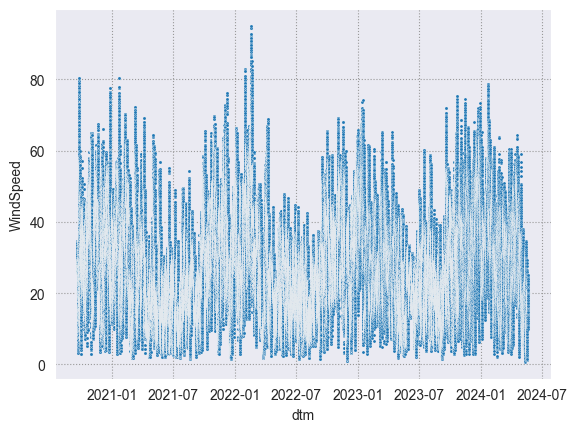

In [61]:
import seaborn as sns

sns.scatterplot(merged_hornsea, x = "dtm", y = "WindSpeed", s = 5)

<Axes: xlabel='dtm', ylabel='Wind_MWh_credit'>

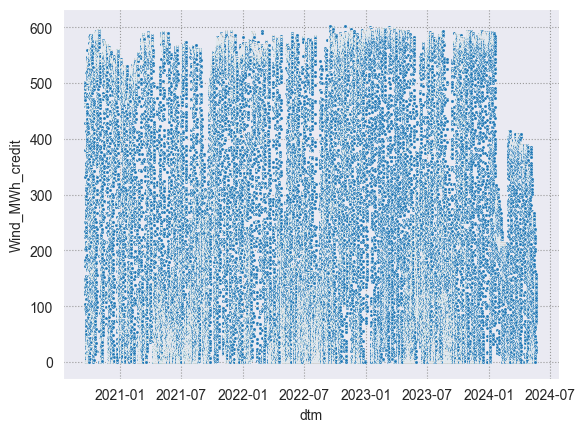

In [60]:
sns.scatterplot(merged_hornsea, x = "dtm", y = "Wind_MWh_credit", s = 5)

<Axes: xlabel='dtm', ylabel='SolarDownwardRadiation'>

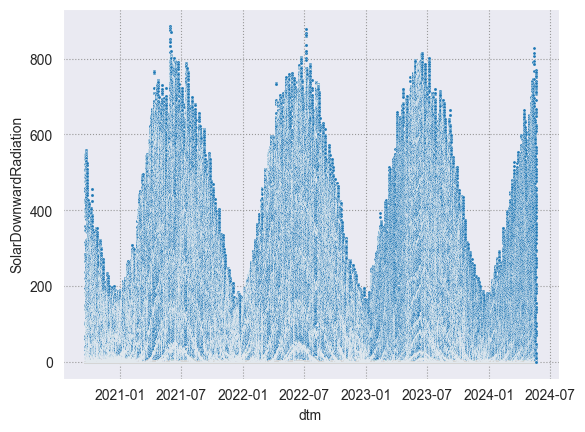

In [58]:
sns.scatterplot(merged_pes, x = "dtm", y = "SolarDownwardRadiation", s = 5)

<Axes: xlabel='dtm', ylabel='Temperature'>

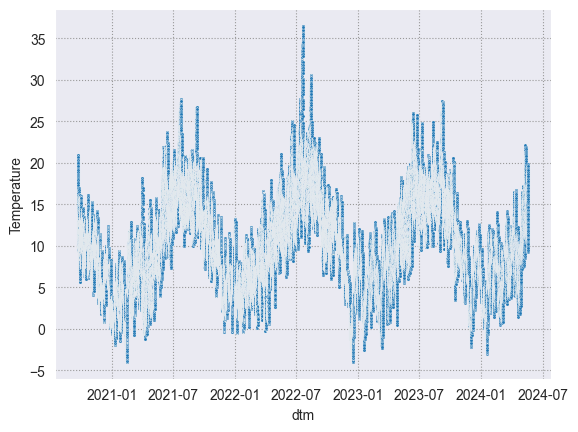

In [59]:
sns.scatterplot(merged_demand, x = "dtm", y = "Temperature", s = 5)

<Axes: xlabel='WindSpeed', ylabel='Wind_MWh_credit'>

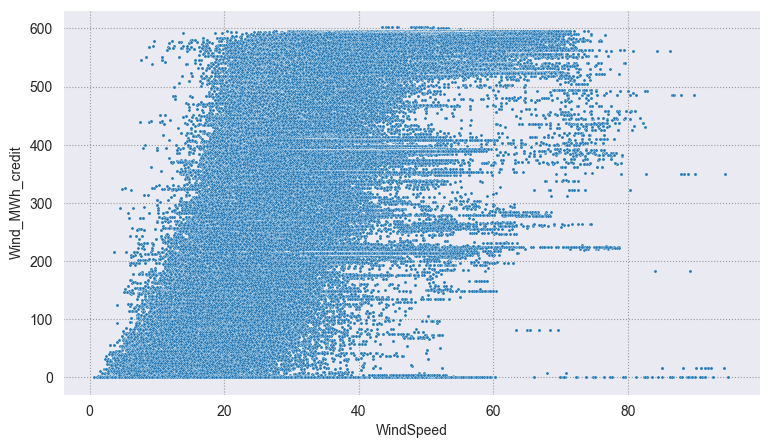

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(9,5))
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.scatterplot(merged_hornsea, x = "WindSpeed", y = "Wind_MWh_credit", s = 5)

<Axes: xlabel='WindSpeed:100', ylabel='Wind_MWh_credit'>

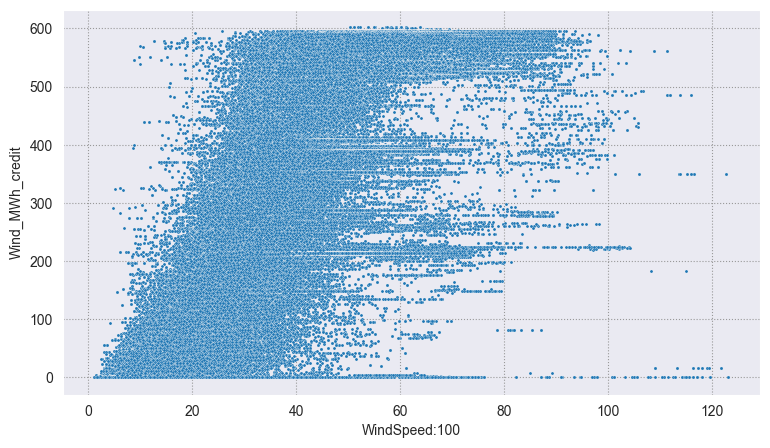

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(9,5))
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.scatterplot(merged_hornsea, x = "WindSpeed:100", y = "Wind_MWh_credit", s = 5)

<Axes: xlabel='SolarDownwardRadiation', ylabel='Solar_MWh_credit'>

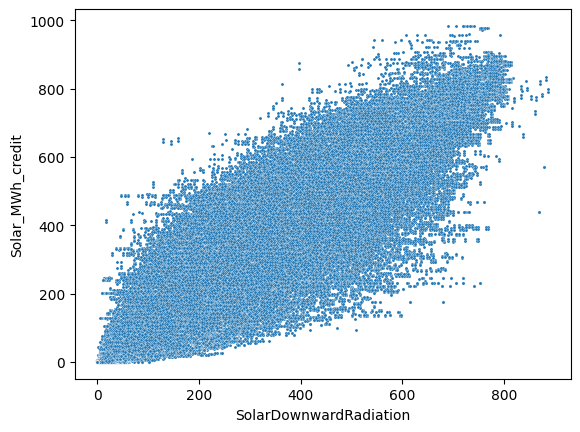

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.scatterplot(merged_pes, x = "SolarDownwardRadiation", y = "Solar_MWh_credit", s = 5)

In [50]:
import plotly.express as px

px.scatter(merged_hornsea[merged_hornsea["WindSpeed"] < 10], x = merged_hornsea[merged_hornsea["WindSpeed"] < 10].index, y = ["WindSpeed", "Wind_MWh_credit"])

<Axes: xlabel='dtm', ylabel='DA_Price'>

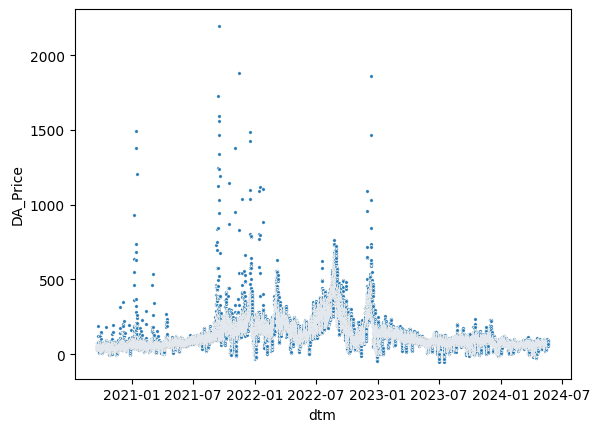

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.scatterplot(merged_hornsea, x = "dtm", y = "DA_Price", s = 5)

Features und Labels

Forecasting: Solar_MWh, Wind_MWh

Trading: Handelbarer Strom